<a href="https://colab.research.google.com/github/bernardowenzel/MVP_SPRINT_1/blob/main/MVP_Bernardo_Wenzel_Sprint_1_Deep_Learning_Versao_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Modelo de Deep Learning para Classificação Binária de imagens de criança e adulto**

Neste notebook, foi explorada a classificação de imagens que distinguem crianças de adultos, usando uma Rede Neural Convolucional Profunda.

No entanto, devido à quantidade limitada de imagens disponíveis, acredita-se que a acurácia do modelo não será tão alta. Para superar essa limitação, implementamos duas abordagens: Image Augmentation e Transfer Learning.

Dataset é composto de 800 imagens, sendo 400 de crianças e 400 de adultos.

# 1 - Importando Bibliotecas

In [1]:
!pip install gdown
import gdown
import os
import zipfile

In [2]:
import warnings
warnings.filterwarnings("ignore")

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models, layers, optimizers, callbacks
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

**Apresenta uma matriz de confusão que permite analisar os valores reais e previstos de uma classe.texto em itálico**

In [3]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

# 2 - Reorganizando os arquivos nas pastas

**Descompactando pasta e jogando para Nova Pasta**

In [6]:
id_arq = "10RpFP2BKz4GqKCP3A_kQ0hZQWHgx4ayE"
url = f"https://drive.google.com/uc?id={id_arq}"

folder_path = "./dataset"  # pasta em que iremos baixar o arquivo zip
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/train.zip"  # pasta em que iremos baixar o arquivo zip
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=10RpFP2BKz4GqKCP3A_kQ0hZQWHgx4ayE
To: /content/dataset/train.zip
100%|██████████| 29.1M/29.1M [00:00<00:00, 48.7MB/s]


'dataset/train.zip'

In [9]:
destination = 'datasets_v2/Crianca_Adulto_Imagens/preprocessing/' # path onde iremos armazenar as imagens

os.makedirs(destination,exist_ok=True) # cria a pasta de destino se necessário

with zipfile.ZipFile(output,'r') as zip_ref:
    zip_ref.extractall(destination)

**Renomeando arquivos**

In [10]:

def adicionar_prefixo_em_arquivos_jpg(caminho_pasta, prefixo):
    # Verifica se o caminho é uma pasta
    if not os.path.isdir(caminho_pasta):
        print("O caminho especificado não é uma pasta válida.")
        return

    # Percorre todos os arquivos na pasta
    for nome_arquivo in os.listdir(caminho_pasta):
        caminho_arquivo_antigo = os.path.join(caminho_pasta, nome_arquivo)

        # Verifica se é um arquivo JPG
        if nome_arquivo.lower().endswith(".jpg"):
            # Cria o novo nome com o prefixo adicionado
            novo_nome_arquivo = prefixo + nome_arquivo
            caminho_arquivo_novo = os.path.join(caminho_pasta, novo_nome_arquivo)

            # Renomeia o arquivo
            os.rename(caminho_arquivo_antigo, caminho_arquivo_novo)
            print(f"Arquivo renomeado: {caminho_arquivo_novo}")

    print("Renomeação concluída.")

# Exemplo de uso da função
caminho_pasta_adulto = r"/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults"  # Substitua pelo caminho correto da pasta
prefixo_adulto = "adu_"  # Substitua pelo prefixo desejado
caminho_pasta_crianca = r"/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/children"  # Substitua pelo caminho correto da pasta
prefixo_crianca = "cri_"  # Substitua pelo prefixo desejado

adicionar_prefixo_em_arquivos_jpg(caminho_pasta_adulto, prefixo_adulto)
adicionar_prefixo_em_arquivos_jpg(caminho_pasta_crianca, prefixo_crianca)

Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_67.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_168.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_227.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_223.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_7.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_18.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_12.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults/adu_187.jpg
Arquivo renomeado: /content/datasets_v2/Crianca_Adult

**Movendo para Pasta Raíz para juntar todos os arquivos de adultos e crianças e depois separar entre treino e teste utilizando o train_test_split.**

In [11]:
import os

# Defina o caminho da pasta pai
caminho_pasta_pai = '/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens'

# Verifica se a pasta pai existe
if not os.path.exists(caminho_pasta_pai):
    os.makedirs(caminho_pasta_pai)
    print(f"Pasta Crianca_Adulto_Imagens '{caminho_pasta_pai}' criada com sucesso!")

# Defina o nome da pasta que você deseja criar dentro da pasta pai
nome_pasta_filha = 'todas_imagens_mvp_v2'

# Caminho completo para a pasta filha
caminho_pasta_filha = os.path.join(caminho_pasta_pai, nome_pasta_filha)

# Verifica se a pasta filha já existe
if not os.path.exists(caminho_pasta_filha):
    os.makedirs(caminho_pasta_filha)
    print(f"Pasta todas_imagens_mvp '{caminho_pasta_filha}' criada com sucesso!")
else:
    print(f"A pasta todas_imagens_mvp '{caminho_pasta_filha}' já existe!")


Pasta Crianca_Adulto_Imagens '/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens' criada com sucesso!
Pasta todas_imagens_mvp '/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2' criada com sucesso!


In [12]:
from pathlib import Path
import shutil
import os

arquivo_adulto = Path('/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults')
arquivo_adulto = arquivo_adulto.iterdir()

arquivo_crianca = Path('/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/children')
arquivo_crianca = arquivo_crianca.iterdir()

arquivo_destino = Path('/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2')

In [13]:
diretorio_origem_adulto = '/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/adults'
diretorio_destino = '/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2'

# Criar o diretório de destino se ele não existir
if not os.path.exists(diretorio_destino):
    os.makedirs(diretorio_destino)

# Obtém a lista de arquivos no diretório de origem
arquivos = os.listdir(diretorio_origem_adulto)

# Percorre a lista de arquivos
for arquivo in arquivos:
    # Verifica se o nome do arquivo contém a palavra "adu"
    if 'adu' in arquivo.lower():
        # Caminho completo do arquivo de origem
        caminho_origem = os.path.join(diretorio_origem_adulto, arquivo)

        # Caminho completo do arquivo de destino
        caminho_destino = os.path.join(diretorio_destino, arquivo)

        # Copia o arquivo para o diretório de destino
        shutil.copy(caminho_origem, caminho_destino)

print("Os arquivos contendo 'adu' no nome foram copiados para o diretório 'train'.")


Os arquivos contendo 'adu' no nome foram copiados para o diretório 'train'.


In [14]:
diretorio_origem_crianca = '/content/datasets_v2/Crianca_Adulto_Imagens/preprocessing/Crianca_Adulto_Imagens/children'
diretorio_destino = '/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2'

# Criar o diretório de destino se ele não existir
if not os.path.exists(diretorio_destino):
    os.makedirs(diretorio_destino)

# Obtém a lista de arquivos no diretório de origem
arquivos = os.listdir(diretorio_origem_crianca)

# Percorre a lista de arquivos
for arquivo in arquivos:
    # Verifica se o nome do arquivo contém a palavra "cri"
    if 'cri' in arquivo.lower():
        # Caminho completo do arquivo de origem
        caminho_origem = os.path.join(diretorio_origem_crianca, arquivo)

        # Caminho completo do arquivo de destino
        caminho_destino = os.path.join(diretorio_destino, arquivo)

        # Copia o arquivo para o diretório de destino
        shutil.copy(caminho_origem, caminho_destino)

print("Os arquivos contendo 'cri' no nome foram copiados para o diretório 'train'.")


Os arquivos contendo 'cri' no nome foram copiados para o diretório 'train'.


In [15]:
r='/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2'
print(os.listdir(r))

['adu_146.jpg', 'cri_327.jpg', 'cri_248.jpg', 'adu_132.jpg', 'cri_85.jpg', 'cri_18.jpg', 'adu_67.jpg', 'cri_259.jpg', 'adu_142.jpg', 'adu_378.jpg', 'cri_143.jpg', 'cri_158.jpg', 'cri_166.jpg', 'cri_318.jpg', 'adu_52.jpg', 'cri_107.jpg', 'adu_9.jpg', 'adu_210.jpg', 'adu_136.jpg', 'adu_310.jpg', 'adu_332.jpg', 'cri_57.jpg', 'adu_359.jpg', 'cri_19.jpg', 'adu_385.jpg', 'adu_86.jpg', 'adu_249.jpg', 'adu_376.jpg', 'cri_211.jpg', 'adu_314.jpg', 'adu_56.jpg', 'cri_215.jpg', 'adu_127.jpg', 'cri_317.jpg', 'cri_234.jpg', 'adu_76.jpg', 'adu_345.jpg', 'cri_207.jpg', 'adu_399.jpg', 'cri_357.jpg', 'cri_101.jpg', 'adu_265.jpg', 'adu_110.jpg', 'adu_41.jpg', 'cri_132.jpg', 'cri_83.jpg', 'cri_220.jpg', 'cri_179.jpg', 'cri_36.jpg', 'adu_59.jpg', 'cri_77.jpg', 'cri_161.jpg', 'cri_189.jpg', 'cri_188.jpg', 'cri_223.jpg', 'cri_230.jpg', 'adu_108.jpg', 'adu_329.jpg', 'adu_1.jpg', 'adu_227.jpg', 'adu_39.jpg', 'cri_330.jpg', 'adu_348.jpg', 'adu_209.jpg', 'cri_343.jpg', 'cri_29.jpg', 'adu_168.jpg', 'cri_365.jpg',

In [19]:
path='/content/datasets_v2/Crianca_Adulto_Imagens/working/Crianca_Adulto_Imagens/todas_imagens_mvp_v2/'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 800 imagens para o treinamento e avaliação do modelo de deep learning


In [20]:
print(f"Primeiras 20 imagens: \n {os.listdir(path)[:20]}")

Primeiras 20 imagens: 
 ['adu_146.jpg', 'cri_327.jpg', 'cri_248.jpg', 'adu_132.jpg', 'cri_85.jpg', 'cri_18.jpg', 'adu_67.jpg', 'cri_259.jpg', 'adu_142.jpg', 'adu_378.jpg', 'cri_143.jpg', 'cri_158.jpg', 'cri_166.jpg', 'cri_318.jpg', 'adu_52.jpg', 'cri_107.jpg', 'adu_9.jpg', 'adu_210.jpg', 'adu_136.jpg', 'adu_310.jpg']


# 3 - Analisando os dados

Realização de breve análise dos dados para conhecimento do dataset, confirmação de que os dados estão balanceados e visualização de alguns exemplos de imagens com suas respectivas classes

**Criando um dataframe com as imagens de crianças e adultos**

In [21]:
images =os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    labels.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [ ]:
df.head()

,images,class,height,width,channels,filesize
0,adu_146.jpg,adu,320,370,3,48118
1,cri_327.jpg,cri,320,370,3,28022
2,cri_248.jpg,cri,320,370,3,32063
3,adu_132.jpg,adu,320,370,3,55873
4,cri_85.jpg,cri,320,370,3,27371


adu    400
cri    400
Name: class, dtype: int64


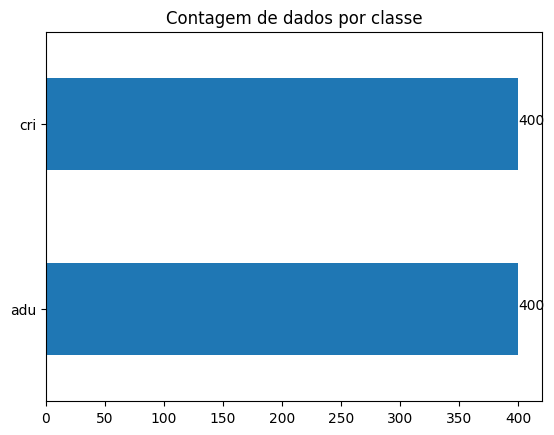

In [22]:
# Criando gráfico de colunas
print((df['class']).value_counts())

# Contagem dos registros para plotar como rótulo de dados
contagem = df['class'].value_counts()

# Incluindo rótulos de dados no gráfico
for i, v in enumerate(contagem):
    plt.text(v, i, str(v))

# Exibir o gráfico
crianca_vs_adulto_count = df['class'].value_counts().plot.barh(title='Contagem de dados por classe')

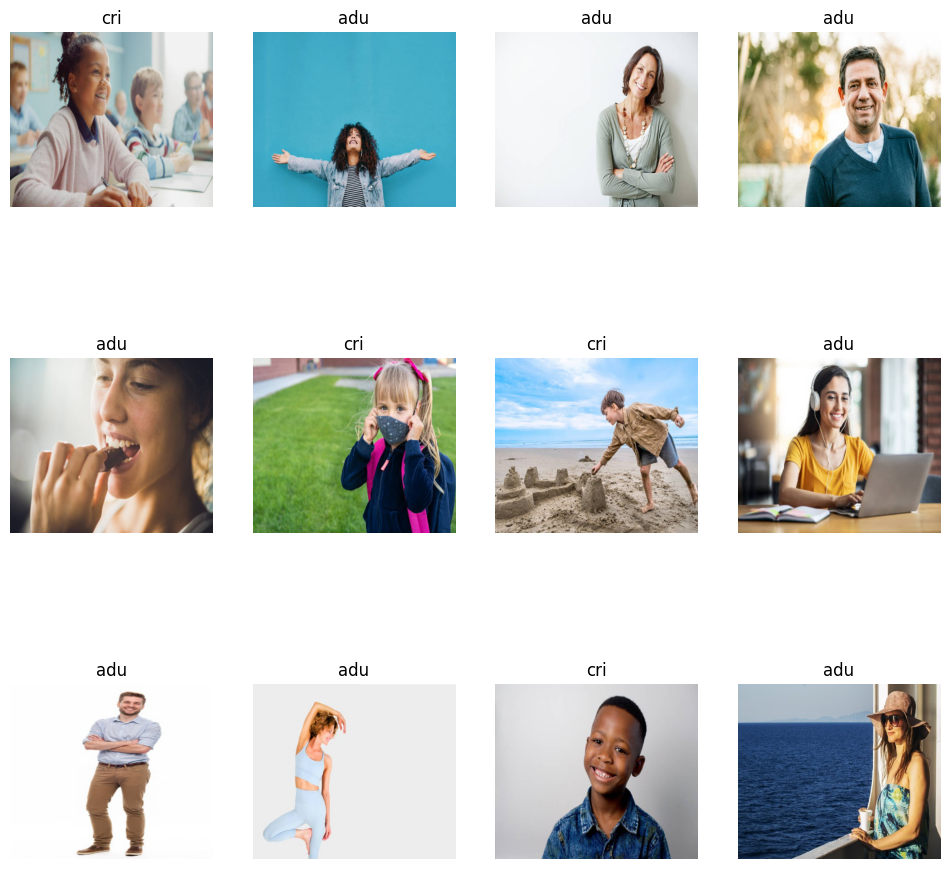

In [23]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

plt.show()

# 4 - Separação em Treino e Teste

**Separação do dataset entre teste e treino, utilizando 20% das imagens para teste e 80% para treino**

In [24]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.2 ,random_state=42 , shuffle=True)

In [25]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
          images class
264    adu_3.jpg   adu
615   cri_16.jpg   cri
329  adu_360.jpg   adu
342   adu_54.jpg   adu
394   adu_95.jpg   adu
..           ...   ...
71    cri_10.jpg   cri
106  adu_197.jpg   adu
270   cri_40.jpg   cri
435  adu_318.jpg   adu
102  cri_355.jpg   cri

[640 rows x 2 columns]
##### Test: #####
          images class
696  cri_326.jpg   cri
667  cri_308.jpg   cri
63   adu_209.jpg   adu
533  cri_136.jpg   cri
66   adu_168.jpg   adu
..           ...   ...
589    cri_7.jpg   cri
798   cri_93.jpg   cri
744  cri_221.jpg   cri
513  adu_303.jpg   adu
670    cri_5.jpg   cri

[160 rows x 2 columns]


# 5 - Preparação dos Dados (Gerador de Imagens)

**Para a preparação dos dados, foi utilizado o ImageDataGenerator da biblioteca Keras para aplicação de algumas técnicas de Data Augmentation. Dessa forma, as imagens são manipuladas para modificarem seus formatos e, consequentemente, evitar a ocorrência de overfitting do modelo.**

In [26]:
train_datagen=ImageDataGenerator(validation_split=0.2, #separando 20% para validação
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=25,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=25,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=25,
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 512 validated image filenames belonging to 2 classes.
Found 128 validated image filenames belonging to 2 classes.
Found 160 validated image filenames belonging to 2 classes.


**Pegando uma imagem como exemplo da preparação feita acima**

Found 1 validated image filenames belonging to 1 classes.


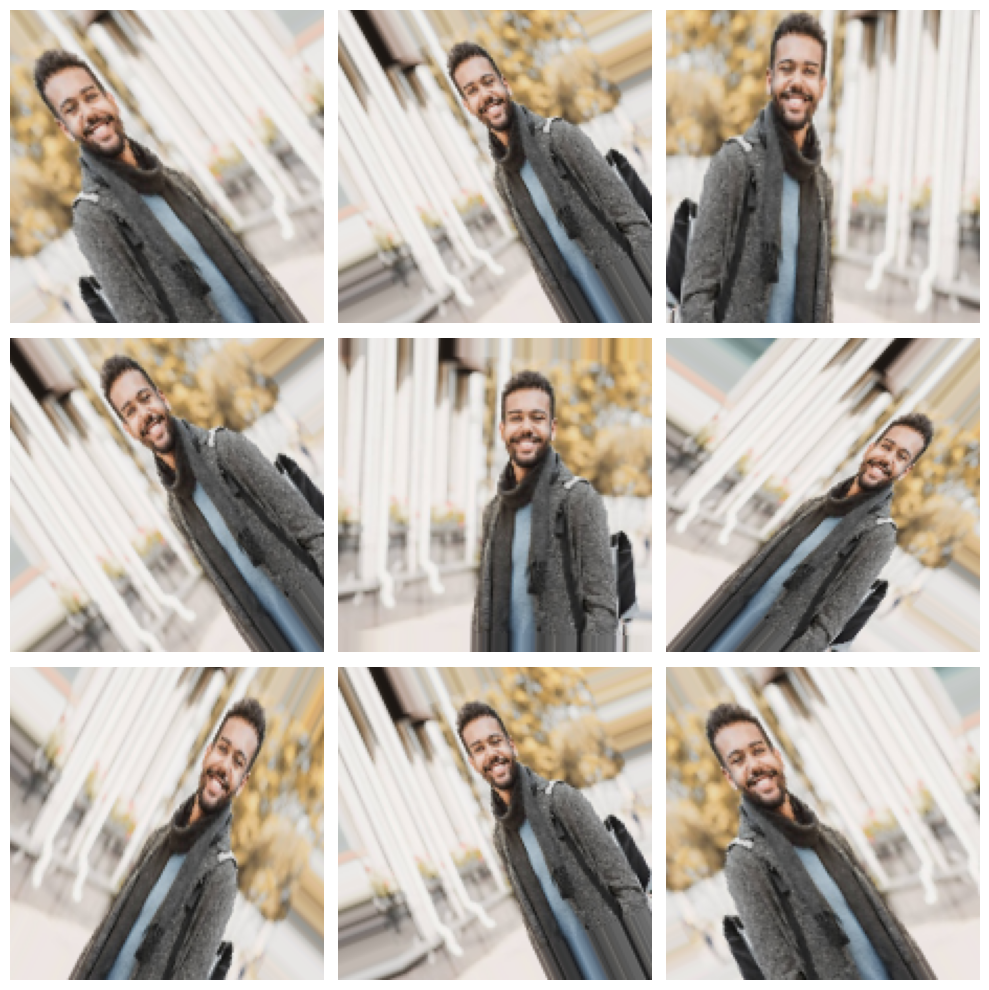

In [27]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# 6 - Criação de modelo DL com rede neural convolucional (CNN) simples com a biblioteca Keras

**Para o modelo, foi utilizado camada convolucional 2D com função de ativação ReLU e camadas de Max Pooling 2D.**

In [28]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [29]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

In [30]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

# 7 - Treinamento do modelo de DL

O "optimizer='adam'" indica qual método de melhoria será usado durante o treinamento.

O "loss='binary_crossentropy'" é a forma de calcular o quão distantes estão as previsões do modelo em relação aos resultados reais. É comum usar isso em problemas de classificação binária, quando temos apenas duas opções.

As "metrics=['accuracy']" são as medidas usadas para avaliar o desempenho do modelo durante o treinamento e também nos testes. Nesse caso, a métrica de interesse é a acurácia, que mede a precisão das previsões do modelo.

Como a base era pequena, foi decidido a utilização do callback para melhorar a eficiência do modelo, colaborar com a prevenção de overfitting e salvar apenas os pesos do modelo que obtiverem a melhor acurácia, visto que tinha-se como premissa uma acurácia não tão alta.

In [31]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

In [32]:
# Definindo callbacks
early_stopping = callbacks.EarlyStopping(patience=10, restore_best_weights=True)
model_checkpoint = callbacks.ModelCheckpoint('best_model.h5', save_best_only=True)

history=model.fit_generator(train_generator ,
                            steps_per_epoch=len(train_generator),
                            epochs=30 ,
                            validation_data=val_generator ,
                            validation_steps=len(val_generator),
                            callbacks=[early_stopping, model_checkpoint])



Epoch 1/30
21/21 [==============================] - 39s 2s/step - loss: 0.7139 - accuracy: 0.4805 - val_loss: 0.6961 - val_accuracy: 0.4688
Epoch 2/30
21/21 [==============================] - 36s 2s/step - loss: 0.6928 - accuracy: 0.4883 - val_loss: 0.6917 - val_accuracy: 0.5156
Epoch 3/30
21/21 [==============================] - 36s 2s/step - loss: 0.6721 - accuracy: 0.5781 - val_loss: 0.6976 - val_accuracy: 0.4844
Epoch 4/30
21/21 [==============================] - 37s 2s/step - loss: 0.6789 - accuracy: 0.5762 - val_loss: 0.6802 - val_accuracy: 0.5547
Epoch 5/30
21/21 [==============================] - 33s 2s/step - loss: 0.6650 - accuracy: 0.5742 - val_loss: 0.6667 - val_accuracy: 0.5312
Epoch 6/30
21/21 [==============================] - 39s 2s/step - loss: 0.6483 - accuracy: 0.5684 - val_loss: 0.6710 - val_accuracy: 0.5391
Epoch 7/30
21/21 [==============================] - 35s 2s/step - loss: 0.6447 - accuracy: 0.6094 - val_loss: 0.6537 - val_accuracy: 0.5938
Epoch 8/30
21/21 [==

Conforme previsto antes da criação do modelo, nota-se uma acurácia baixa, com picos atingindo em torno de 69% e foi melhorando com o decorrer das épocas, sofrendo algumas oscilações.

# 8 - Visualização de métricas do modelo treinado

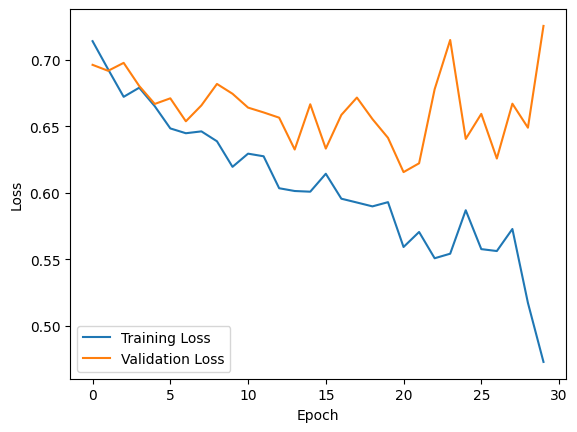

In [33]:

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


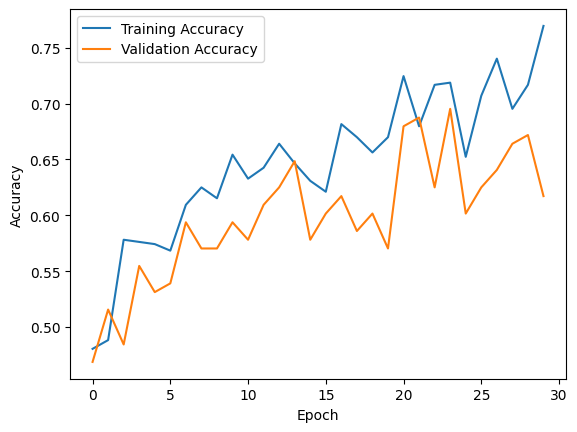

In [34]:

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# 9 - Execução do modelo treinado em subconjuntos do Teste

1/1 [==============================] - 0s 471ms/step


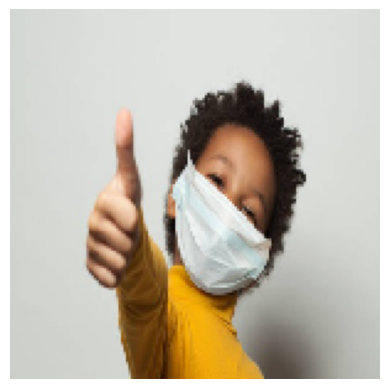

Label:  cri
Previsão:  adu
Probabilidade:  0.6113103


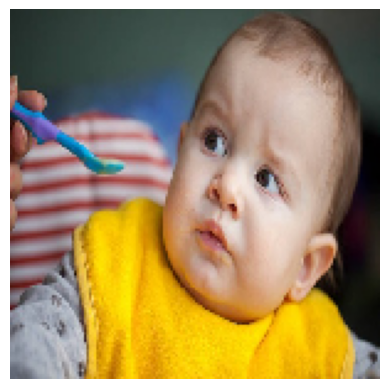

Label:  cri
Previsão:  cri
Probabilidade:  0.35761237


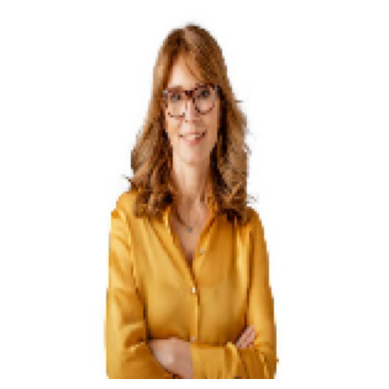

Label:  adu
Previsão:  cri
Probabilidade:  0.18028474


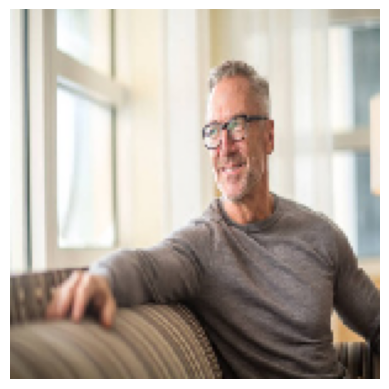

Label:  adu
Previsão:  cri
Probabilidade:  0.07944348


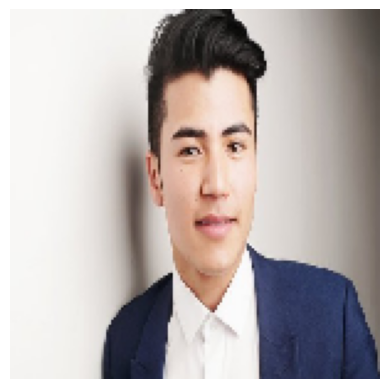

Label:  adu
Previsão:  cri
Probabilidade:  0.39775425


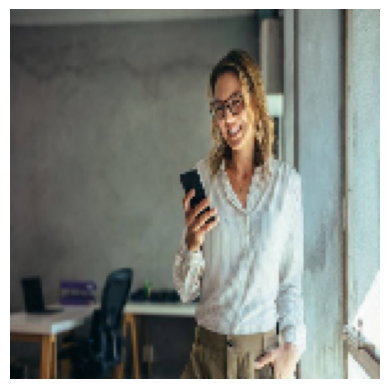

Label:  adu
Previsão:  cri
Probabilidade:  0.09145525


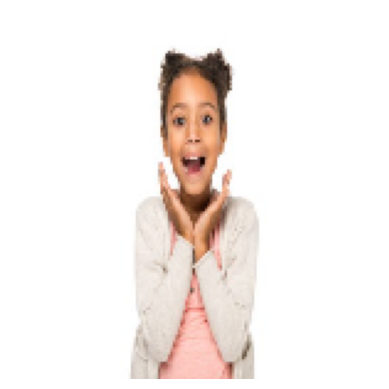

Label:  cri
Previsão:  cri
Probabilidade:  0.2673217


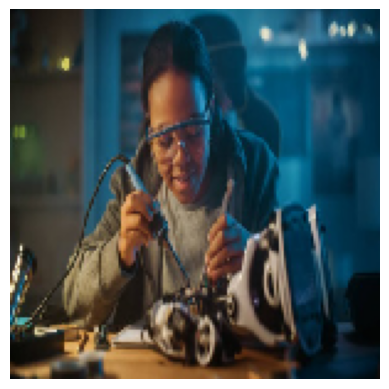

Label:  cri
Previsão:  cri
Probabilidade:  0.07313097


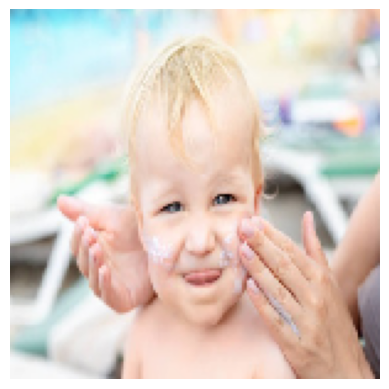

Label:  cri
Previsão:  adu
Probabilidade:  0.53637516


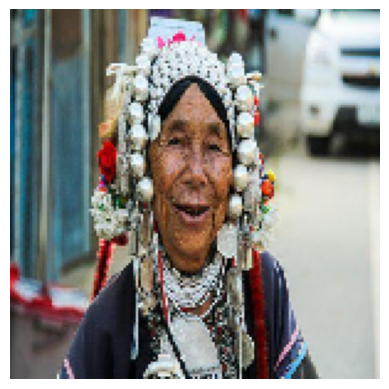

Label:  adu
Previsão:  cri
Probabilidade:  0.021087391


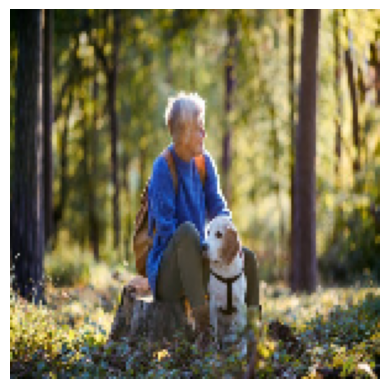

Label:  adu
Previsão:  cri
Probabilidade:  0.16358261


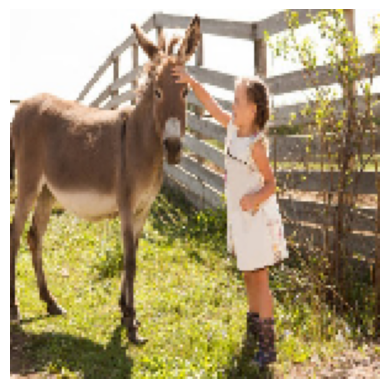

Label:  cri
Previsão:  cri
Probabilidade:  0.097385414


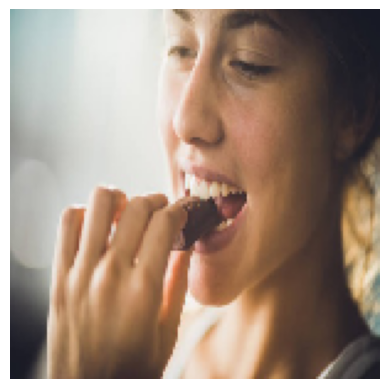

Label:  adu
Previsão:  cri
Probabilidade:  0.28334966


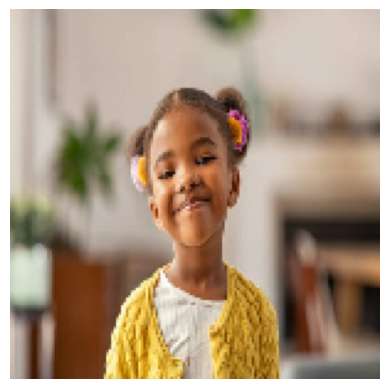

Label:  cri
Previsão:  adu
Probabilidade:  0.581034


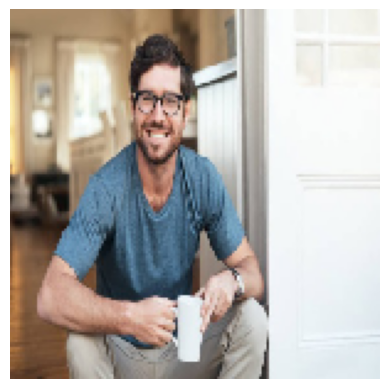

Label:  adu
Previsão:  cri
Probabilidade:  0.00967531


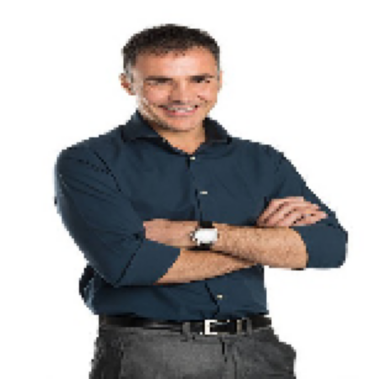

Label:  adu
Previsão:  cri
Probabilidade:  0.025074992


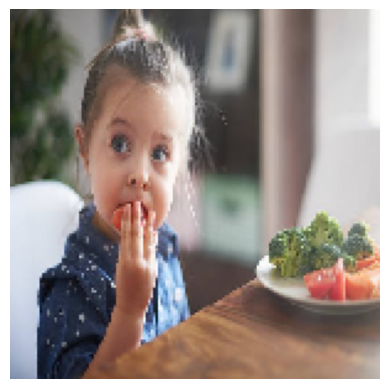

Label:  cri
Previsão:  cri
Probabilidade:  0.18965814


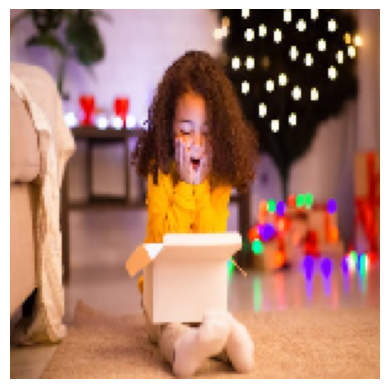

Label:  cri
Previsão:  cri
Probabilidade:  0.31117034


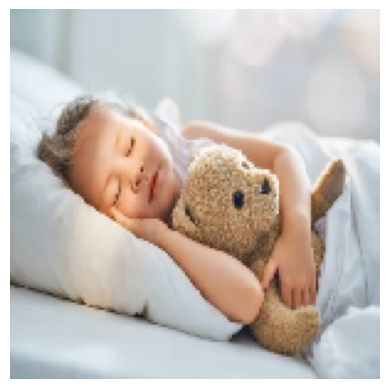

Label:  cri
Previsão:  adu
Probabilidade:  0.6348193


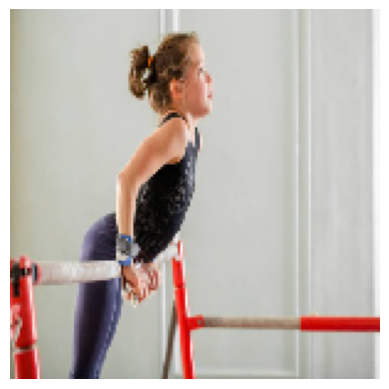

Label:  cri
Previsão:  cri
Probabilidade:  0.039921857


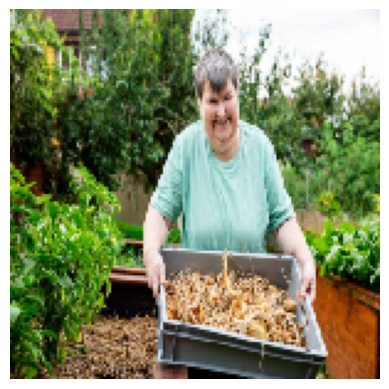

Label:  adu
Previsão:  cri
Probabilidade:  0.13489518


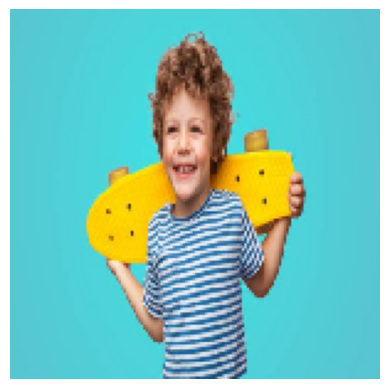

Label:  cri
Previsão:  cri
Probabilidade:  0.3393634


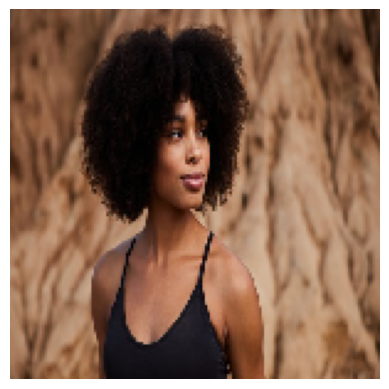

Label:  adu
Previsão:  adu
Probabilidade:  0.8140247


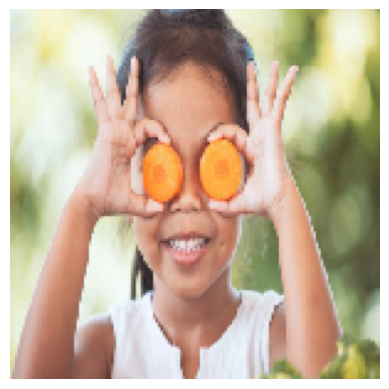

Label:  cri
Previsão:  cri
Probabilidade:  0.2758184


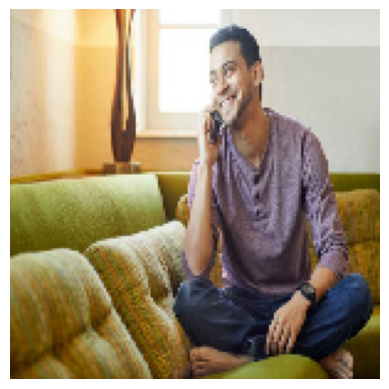

Label:  adu
Previsão:  cri
Probabilidade:  0.14160246


In [35]:
count = 0
y_pred = list()
y_true = list()
class_names = ['adu', 'cri']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'adu' if prediction >= 0.5 else 'cri'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

Percebe-se que em alguns dos exemplos plotados acima houve erro da previsão em relação a classe da imagem, como já era esperado.

# 10 - Avaliação do modelo de Deep Learning

**Acurácia do modelo nos dados de teste**

In [36]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

Test: accuracy = 0.662500  ;  loss = 0.752899 


Seguindo a linha do modelo treinado, a acurácia do modelo nas imagens de teste está de acordo com o conjunto de imagens de treino.

**Visualização de métricas da avaliação do modelo**


O desempenho do modelo é avaliado através de métricas calculadas em um subconjunto das imagens de teste. Essas métricas fornecem insights sobre a qualidade das previsões e a capacidade de generalização do modelo.

São elas: acurácia, precisão, recall e f1-score.

In [37]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.4
Precision:  0.33
Recall:  0.4
F1 Score:  0.3401069518716578


**Criação da matriz de confusão para analisar as previsões corretas e incorretas do modelo de Deep Learning em um conjunto de imagens de teste, permitindo identificar os acertos e erros de classificação.**

Matriz de confusão sem normalização


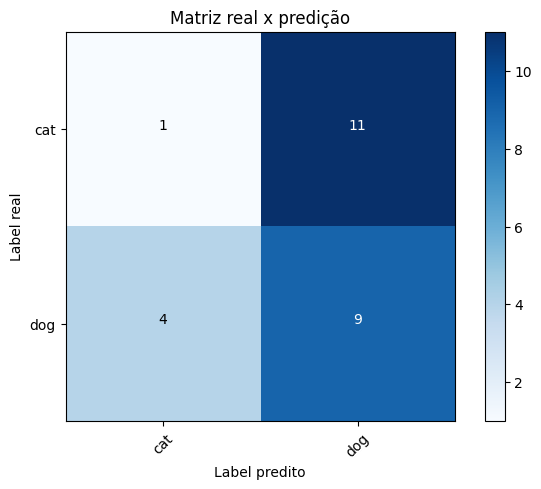

In [38]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['cat',
                               'dog'],
                      normalize= False,
                      title='Matriz real x predição')

# 11 - Exportação do modelo de deep learning para utilizações futuras

**Salvar modelo de DL treinado**

In [39]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = '/content/datasets_v2/Crianca_Adulto_Imagens/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-22T1557.h5


# 12 - Teste do Modelo Exportado

**Carregando o modelo salvo**

In [40]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-22T1557.h5 carregado com sucesso


**Execução do modelo em um subconjunto de imagens de teste**

1/1 [==============================] - 0s 431ms/step


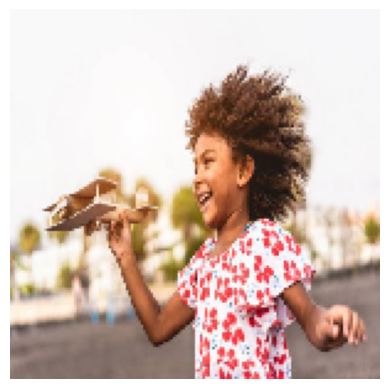

Label:  cri
Previsão:  adu
Probabilidade:  0.81351626


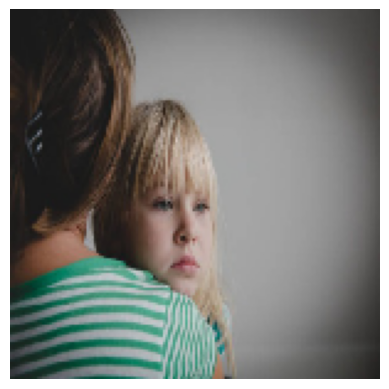

Label:  cri
Previsão:  cri
Probabilidade:  0.4594181


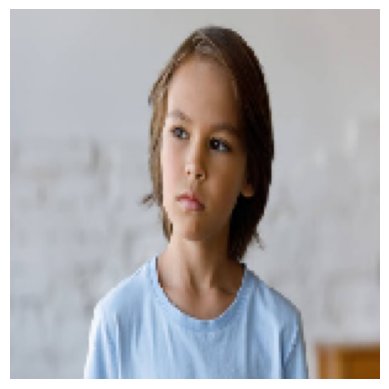

Label:  cri
Previsão:  cri
Probabilidade:  0.24231495


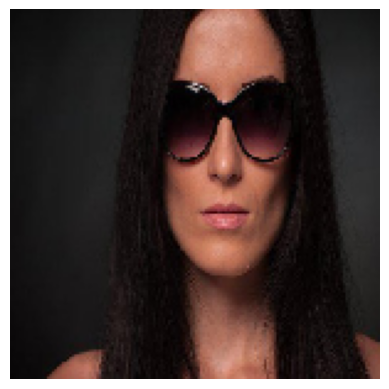

Label:  adu
Previsão:  cri
Probabilidade:  0.45710626


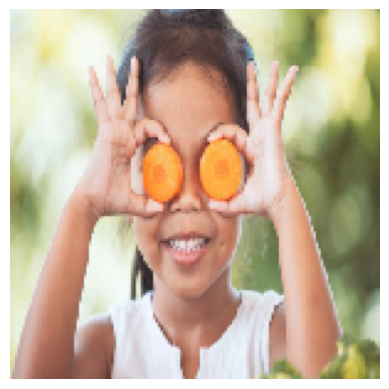

Label:  cri
Previsão:  cri
Probabilidade:  0.2758184


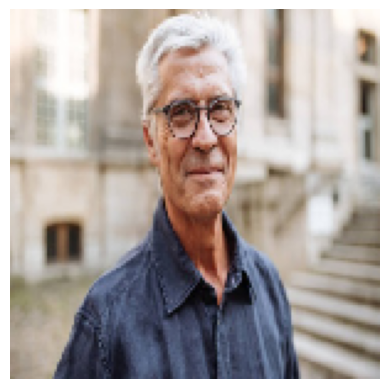

Label:  adu
Previsão:  cri
Probabilidade:  0.042189095


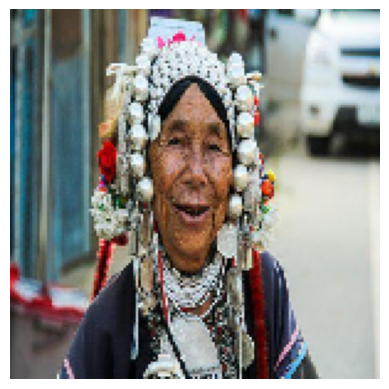

Label:  adu
Previsão:  cri
Probabilidade:  0.021087391


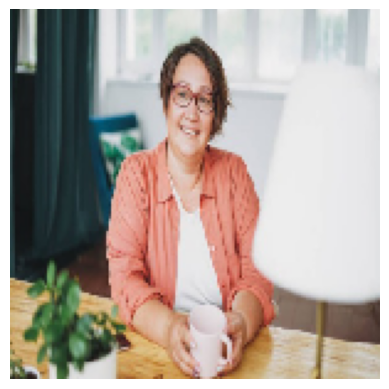

Label:  adu
Previsão:  adu
Probabilidade:  0.7355315


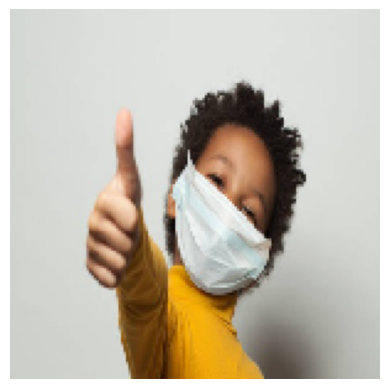

Label:  cri
Previsão:  adu
Probabilidade:  0.6113103


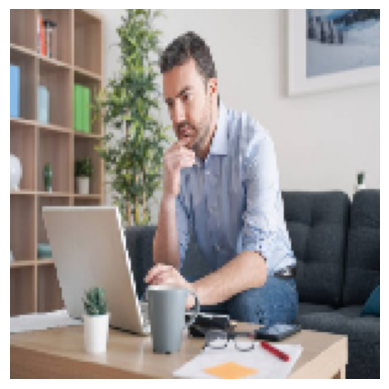

Label:  adu
Previsão:  cri
Probabilidade:  0.014313613


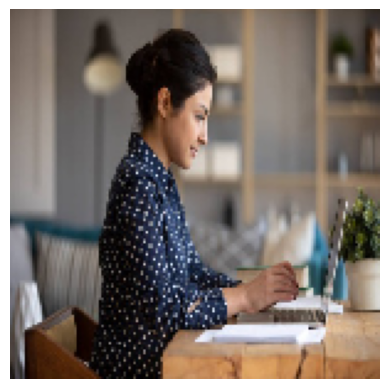

Label:  adu
Previsão:  cri
Probabilidade:  0.051249962


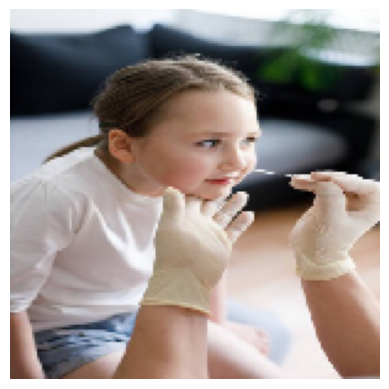

Label:  cri
Previsão:  adu
Probabilidade:  0.79858834


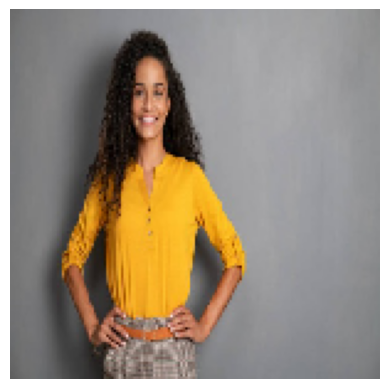

Label:  adu
Previsão:  cri
Probabilidade:  0.13031304


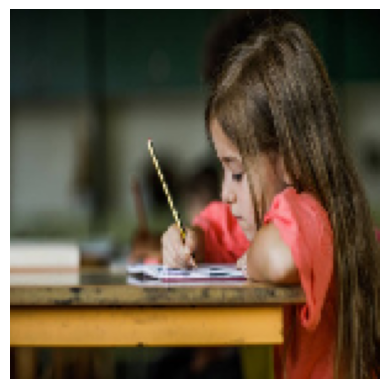

Label:  cri
Previsão:  adu
Probabilidade:  0.6216395


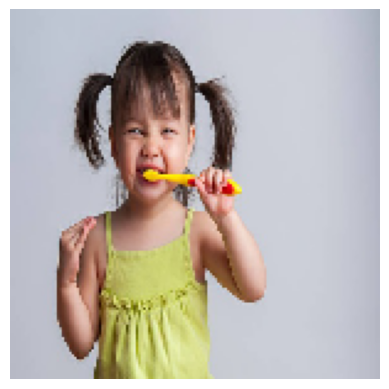

Label:  cri
Previsão:  adu
Probabilidade:  0.59141076


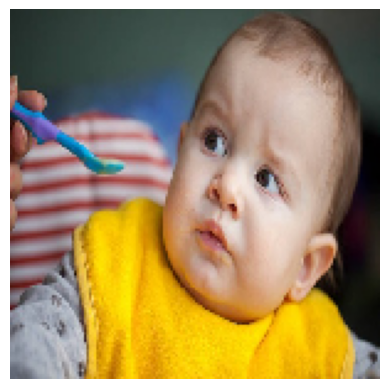

Label:  cri
Previsão:  cri
Probabilidade:  0.35761237


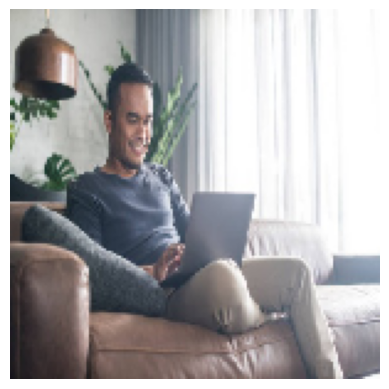

Label:  adu
Previsão:  cri
Probabilidade:  0.045615338


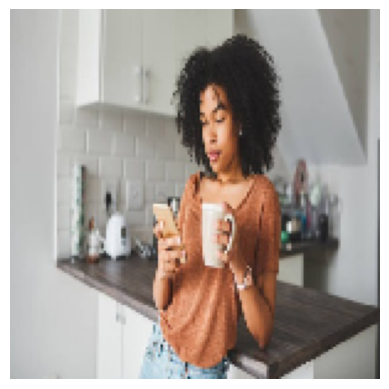

Label:  adu
Previsão:  adu
Probabilidade:  0.5818869


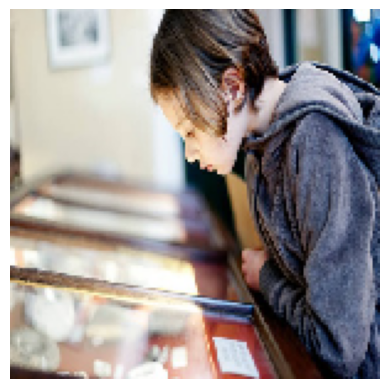

Label:  cri
Previsão:  cri
Probabilidade:  0.037028547


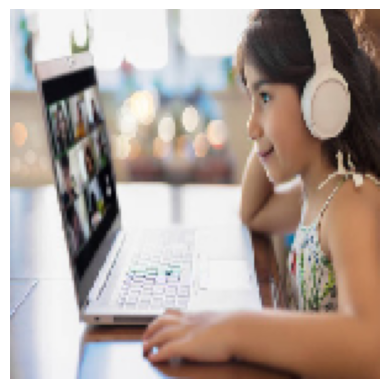

Label:  cri
Previsão:  cri
Probabilidade:  0.36997238


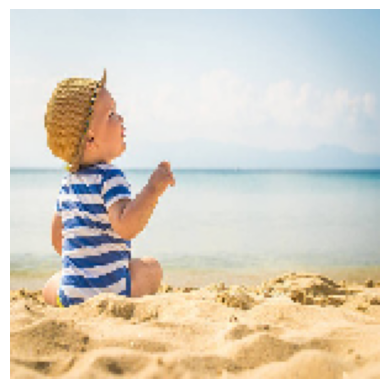

Label:  cri
Previsão:  adu
Probabilidade:  0.62925637


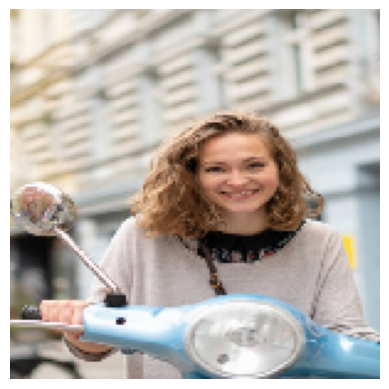

Label:  adu
Previsão:  cri
Probabilidade:  0.09697763


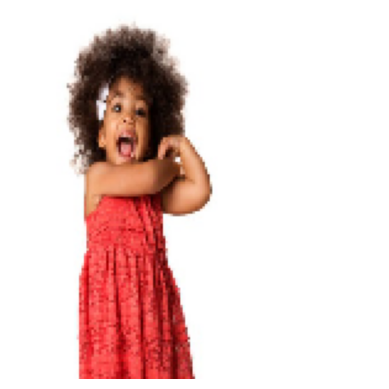

Label:  cri
Previsão:  adu
Probabilidade:  0.67087495


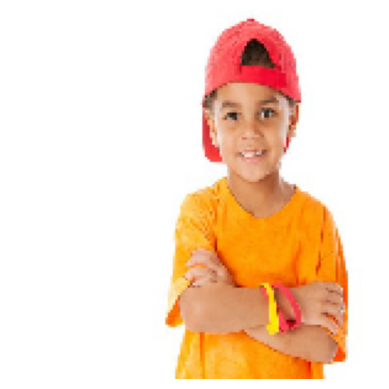

Label:  cri
Previsão:  cri
Probabilidade:  0.06265009


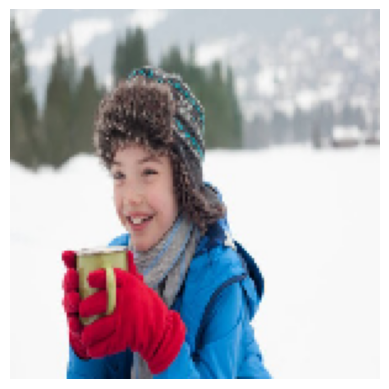

Label:  cri
Previsão:  adu
Probabilidade:  0.6909687


In [41]:
count = 0
y_pred = list()
y_true = list()
class_names = ['adu', 'cri']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'adu' if prediction >= 0.5 else 'cri'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

# 13 - Conclusão

A hipótese inicial foi comprovada. Como a base de imagens não era muito extensa, esperava-se uma acurácia baixa.

Para tentar melhorar o modelo, foram feitos alguns tratamentos após os treinamentos como, por exemplo:

- Aumento da porção de treinamento de 70% para 80%;
- Aumento do batch size de 15 para 25;
- Aumento do número de épocas de 20 para 30.

Esses ajustes contribuíram para um ganho de cerca de 10% de acurácia, saindo  de 56% para 66%, com oscilações tendo picos de 69~70%.

Como principal melhoria para o modelo, seria o aumento do número de imagens do dataset para ter um modelo mais robusto capaz de aprender melhor com mais exemplos